### USC ID  : 8534717045
### NAME   : SRINATH BEGUDEM
### GITHUB: SrinathBegudem

In [1]:
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, roc_auc_score
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier
from sklearn.svm import SVC
import numpy as np
import warnings
warnings.filterwarnings("ignore")

## 1. (a) Download the APS Failure data from: https://archive.ics.uci.edu/ml/datasets/ APS+Failure+at+Scania+Trucks . The dataset contains a training set and a test set. The training set contains 60,000 rows, of which 1,000 belong to the positive class and 171 columns, of which one is the class column. All attributes are numeric.

In [2]:
training_data = pd.read_csv("../data/aps_failure_training_set.csv", skiprows=20, na_values="na")
testing_data = pd.read_csv("../data/aps_failure_test_set.csv", skiprows=20, na_values="na")
training_features = training_data.drop(columns=['class'])
training_labels = training_data['class']

testing_features = testing_data.drop(columns=['class'])
testing_labels = testing_data['class']


In [3]:
training_data

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,neg,33058,NaN,0.000000e+00,NaN,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,neg,41040,NaN,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,neg,12,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,neg,60874,NaN,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,NaN,6.640000e+02,186.0,0.0,0.0,0.0,0.0,0.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,neg,2286,NaN,2.130707e+09,224.0,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,neg,112,0.0,2.130706e+09,18.0,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,neg,80292,NaN,2.130706e+09,494.0,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [4]:
testing_data

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0.0,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,neg,82,0.0,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,neg,66002,2.0,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,neg,59816,NaN,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,neg,1814,NaN,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,NaN,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
15996,neg,18,0.0,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
15997,neg,79636,NaN,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
15998,neg,110,NaN,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


In [5]:
# REMOVED THE CLASS COLUMN TO PERFORM STATS 
training_features

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,33058,NaN,0.000000e+00,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,41040,NaN,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,12,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,318.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,60874,NaN,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,153002,NaN,6.640000e+02,186.0,0.0,0.0,0.0,0.0,0.0,2564.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,2286,NaN,2.130707e+09,224.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,112,0.0,2.130706e+09,18.0,0.0,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,80292,NaN,2.130706e+09,494.0,0.0,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [6]:
# TESTING DATA WITH CLASS     
testing_features

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,60,0.0,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,2682.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,82,0.0,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,66002,2.0,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,199486.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,59816,NaN,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,1814,NaN,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,81852,NaN,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
15996,18,0.0,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
15997,79636,NaN,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
15998,110,NaN,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


## 1. (b) Data Preparation
## This data set has missing values. When the number of data with missing values is significant, discarding them is not a good idea.

### 1. (b) i. Research what types of techniques are usually used for dealing with data with missing values. Pick at least one of them and apply it to this data in the next steps.

#### There are many ways to handle missing values. Some of them are

#### 1. Remove samples that contain a missing value
#### 2. Replace missing values with a constant value that has meaning within the domain Ex: Categorical Features
#### 3. Replace missing values with a feature value from another randomly selected observation
#### 4. Replace missing values with a statistics such as mean, median or mode value of the feature/column.
#### 5. Expectation Maximization

#### Mean Data Imputation is implemented here

In [7]:
# REPLACED THE NAN VALUES WITH THE MEAN
training_features = training_features.fillna(training_features.mean())
testing_features = testing_features.fillna(testing_features.mean())

#JOINED THE DATA SET AFTER FILLING NAN WITH MEAN AS WE KNOW CLASS IS A STRING AND WILL CAUSE ERROR IF WE DONT DROP AND PERFORM THE CALCULATIONS 
training_data = training_data.iloc[:, 0:1]
training_data = pd.concat([training_data['class'], training_features], axis=1)

testing_data = testing_data.iloc[:, 0:1]
testing_data = pd.concat([testing_data['class'], testing_features], axis=1)


In [8]:
training_data

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,0.713189,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,neg,33058,0.713189,0.000000e+00,190620.639314,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,neg,41040,0.713189,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,neg,12,0.000000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,neg,60874,0.713189,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,0.713189,6.640000e+02,186.000000,0.0,0.0,0.0,0.0,0.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,neg,2286,0.713189,2.130707e+09,224.000000,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,neg,112,0.000000,2.130706e+09,18.000000,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,neg,80292,0.713189,2.130706e+09,494.000000,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [9]:
testing_data

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0.000000,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,neg,82,0.000000,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,neg,66002,2.000000,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,neg,59816,0.772065,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,neg,1814,0.772065,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,0.772065,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
15996,neg,18,0.000000,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
15997,neg,79636,0.772065,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
15998,neg,110,0.772065,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


### 1. (b) ii. For each of the 170 features, calculate the coefficient of variation CV = s/m , where s is sample standard deviation and m is sample mean.

In [10]:
cv = training_features.std() / training_features.mean()

print(cv)

aa_000      2.450938
ab_000      2.328400
ac_000      2.169767
ad_000    183.847620
ae_000     23.190937
             ...    
ee_007      4.962483
ee_008      3.222010
ee_009      5.626979
ef_000     47.124953
eg_000     40.553250
Length: 170, dtype: float64


### 1. (b) iii. Plot a correlation matrix for your features using pandas or any other tool.

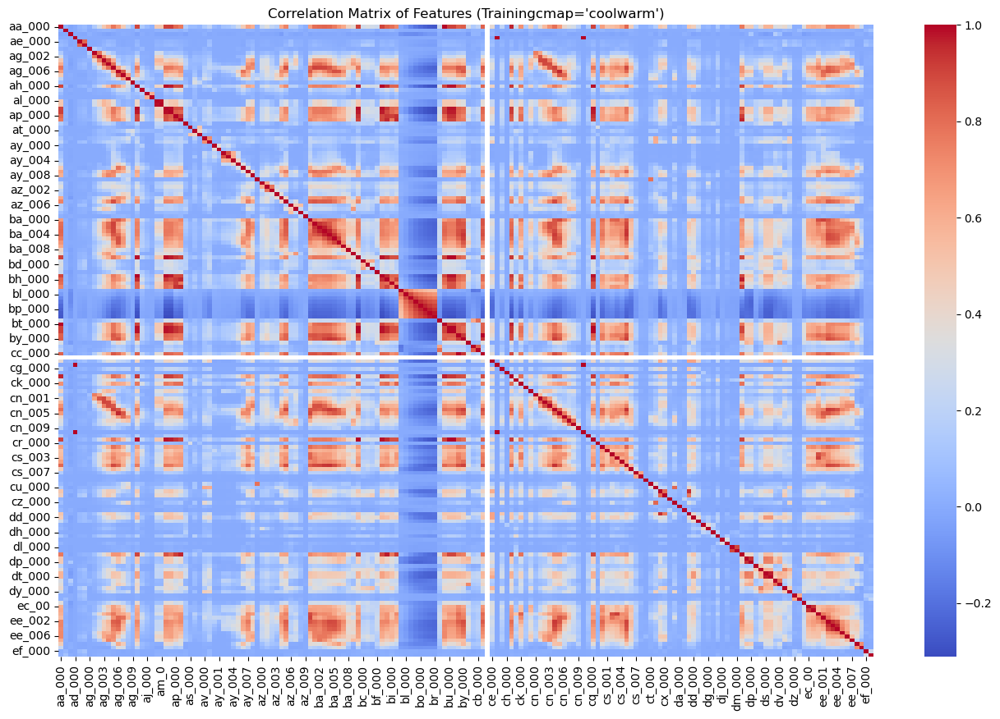

In [11]:
correlation_matrix_train = training_features.corr()

plt.figure(figsize=(16, 10))
sb.heatmap(correlation_matrix_train, cmap='coolwarm')
plt.title("Correlation Matrix of Features (Trainingcmap='coolwarm')")
plt.show()


### 1. (b) iv. Pick $\sqrt{170}\$ features with highest CV , and make scatter plots and box plots for them, similar to those on p. 129 of ISLR. Can you draw conclusions about significance of those features, just by the scatter plots? This does not mean that you will only use those features in the following questions. We picked them only for visualization.

In [12]:
top_cv_features = cv.nlargest(13).index

selected_training_data = training_data[top_cv_features]


In [13]:
selected_training_data

,cs_009,cf_000,co_000,ad_000,dh_000,dj_000,ag_000,as_000,ay_009,az_009,ak_000,au_000,ch_000
0,0.0,2.000000,220.000000,280.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1,0.0,190221.810984,190515.566938,190620.639314,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000443
2,0.0,0.000000,0.000000,100.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
3,0.0,2.000000,2.000000,66.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
4,0.0,0.000000,202.000000,458.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.0,0.000000,224.000000,186.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
59996,0.0,2.000000,0.000000,224.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
59997,0.0,2.000000,0.000000,18.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
59998,0.0,2.000000,580.000000,494.000000,190.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


### Since running the pairplot on the entire dataset is time-consuming and often leads to kernel crashes, I've opted to sample 1000 data points. In most scenarios, this sample size provides sufficient insight into the data, allowing us to identify key patterns and relationships effectively.

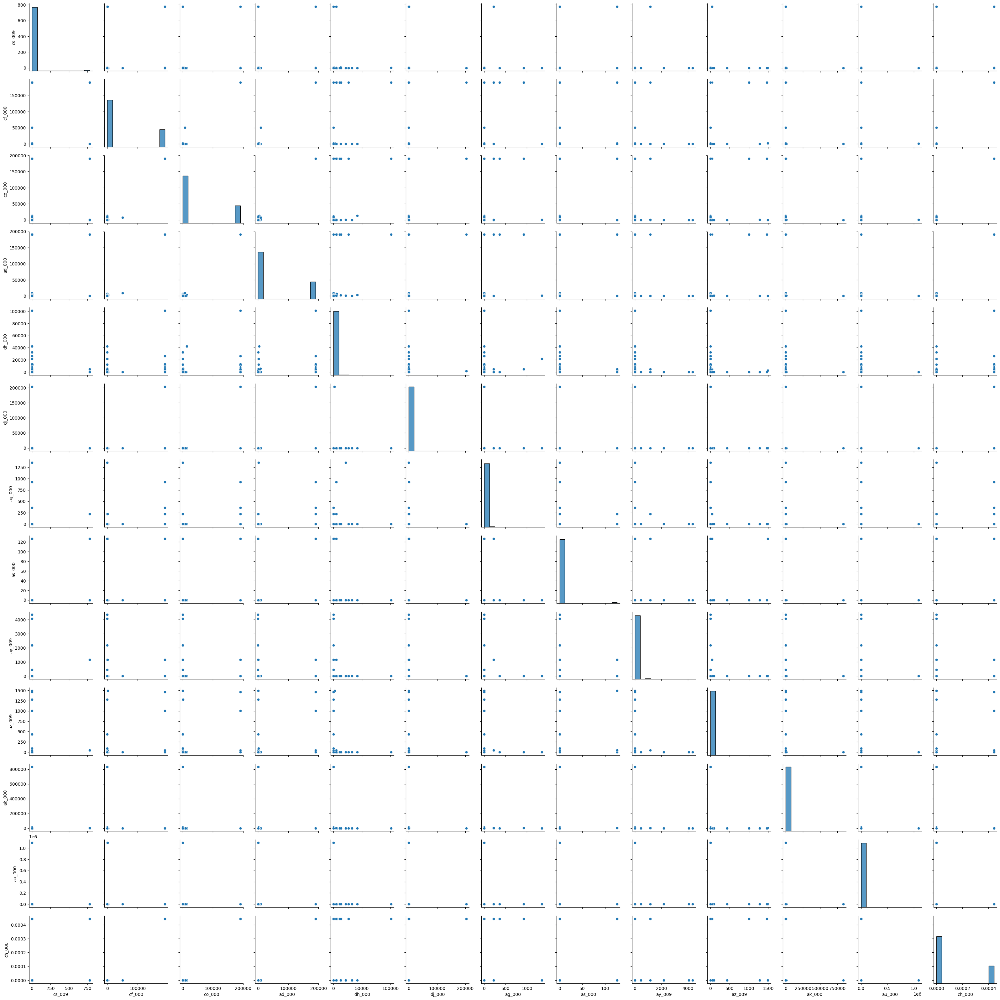

In [14]:
sb.pairplot(selected_training_data.sample(1000))


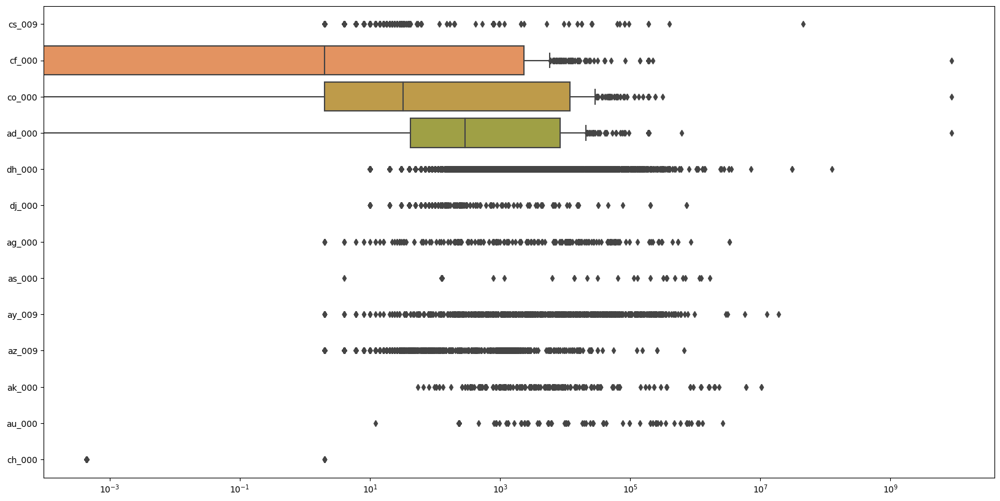

In [15]:
fig, ax = plt.subplots(figsize=(20,10))
boxplot = sb.boxplot(ax=ax,data=selected_training_data, orient='h')
boxplot.set(xscale="log")
plt.show()


###  Insights:
- Relying solely on scatter plots for drawing significant conclusions may prove challenging. Employing a log-scale on box plots enhances clarity, particularly when visualizing extensive datasets. Box plots excel in facilitating comparisons, especially in scenarios with numerous data points and groups. Their succinct representation of data distributions enables efficient assessments of variations and tendencies across different categories or groups.

### 1. (b) v. Determine the number of positive and negative data. Is this data set imbalanced?

In [16]:
def check_data_balance(data_set, data_set_name):
    positive_count = (data_set['class'] == 'pos').sum()
    negative_count = (data_set['class'] == 'neg').sum()

    print(f"Number of positive instances in {data_set_name}: {positive_count}")
    print(f"Number of negative instances in {data_set_name}: {negative_count}")

    if positive_count > negative_count:
        imbalance_ratio = negative_count / positive_count
        print(f"Imbalance Ratio (Negative to Positive) in {data_set_name}: {imbalance_ratio}")
    else:
        imbalance_ratio = positive_count / negative_count
        print(f"Imbalance Ratio (Positive to Negative) in {data_set_name}: {imbalance_ratio}")




In [17]:
check_data_balance(training_data, "Training Data")

Number of positive instances in Training Data: 1000
Number of negative instances in Training Data: 59000
Imbalance Ratio (Positive to Negative) in Training Data: 0.01694915254237288


In [18]:
check_data_balance(testing_data, "Testing Data")

Number of positive instances in Testing Data: 375
Number of negative instances in Testing Data: 15625
Imbalance Ratio (Positive to Negative) in Testing Data: 0.024


### Insight:
- The dataset exhibits significant imbalance. This is evident from the substantial difference in the number of data points between the positive and negative classes, as observed in the preceding cells.

### 1. (c) Train a random forest to classify the data set. Do NOT compensate for class imbalance in the data set. Calculate the confusion matrix, ROC, AUC, and misclassification for training and test sets and report them (You may use pROC package). Calculate Out of Bag error estimate for your random forset and compare it to the test error.

In [19]:
training_data['class'] = training_data['class'].map({'pos': 1, 'neg': 0})
testing_data['class'] = testing_data['class'].map({'pos': 1, 'neg': 0})


In [20]:
training_data

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,76698,0.713189,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,0,33058,0.713189,0.000000e+00,190620.639314,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,0,41040,0.713189,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,0,12,0.000000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,0,60874,0.713189,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0,153002,0.713189,6.640000e+02,186.000000,0.0,0.0,0.0,0.0,0.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,0,2286,0.713189,2.130707e+09,224.000000,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,0,112,0.000000,2.130706e+09,18.000000,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,0,80292,0.713189,2.130706e+09,494.000000,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [21]:
testing_data

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,60,0.000000,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,0,82,0.000000,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,0,66002,2.000000,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,0,59816,0.772065,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,0,1814,0.772065,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,0,81852,0.772065,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
15996,0,18,0.000000,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
15997,0,79636,0.772065,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
15998,0,110,0.772065,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


### In this scenario, allowing the decision tree to grow unrestrictedly can lead to achieving different metrics compared to when a specific maximum depth is specified.

In [22]:
# In this code the max_depth = none(deafult) allowed it to grow completely  gave me the resulantant metrics 

X_training = training_data.iloc[:, 1:]
y_training = training_data['class']

X_testing = testing_data.iloc[:, 1:]
y_testing = testing_data['class']

random_forest_classifier = RandomForestClassifier(random_state=42,n_jobs = -1, oob_score=True)
random_forest_classifier.fit(X_training, y_training)

y_training_pred = random_forest_classifier.predict(X_training)
y_testing_pred = random_forest_classifier.predict(X_testing)

confusion_matrix_training = confusion_matrix(y_training, y_training_pred)
confusion_matrix_testing = confusion_matrix(y_testing, y_testing_pred)

y_testing_prob = random_forest_classifier.predict_proba(X_testing)[:, 1]

fpr, tpr, _ = roc_curve(y_testing, y_testing_prob)
roc_auc = auc(fpr, tpr)

y_training_prob = random_forest_classifier.predict_proba(X_training)[:, 1]

fpr_training, tpr_training, _ = roc_curve(y_training, y_training_prob)
roc_auc_training = auc(fpr_training, tpr_training)

misclassification_training = 1 - accuracy_score(y_training, y_training_pred)
misclassification_testing = 1 - accuracy_score(y_testing, y_testing_pred)

oob_error_estimate = 1 - random_forest_classifier.oob_score_

print("Confusion Matrix (Training Set):\n", confusion_matrix_training)
print("Confusion Matrix (Test Set):\n", confusion_matrix_testing)
print("ROC AUC (Training Set):", roc_auc_training)
print("ROC AUC (Test Set):", roc_auc)
print("Misclassification (Training Set):", misclassification_training)
print("Misclassification (Test Set):", misclassification_testing)
print("Out of Bag (OOB) Error Estimate:", oob_error_estimate)


Confusion Matrix (Training Set):
 [[59000     0]
 [    1   999]]
Confusion Matrix (Test Set):
 [[15605    20]
 [  101   274]]
ROC AUC (Training Set): 0.9999999999999999
ROC AUC (Test Set): 0.9936762026666668
Misclassification (Training Set): 1.666666666666483e-05
Misclassification (Test Set): 0.0075625000000000275
Out of Bag (OOB) Error Estimate: 0.006000000000000005


### Insight:
- The proximity between the out-of-bag (OOB) error estimate and the test error implies that the random forest model is effectively generalizing to unseen data. This observation underscores the model's robustness and suggests that it is not overfitting to the training data.

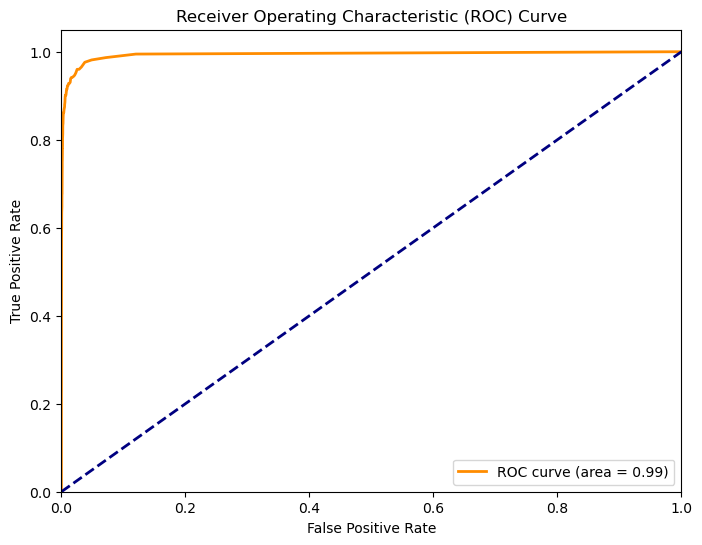

In [23]:
fpr, tpr, _ = roc_curve(y_testing, y_testing_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


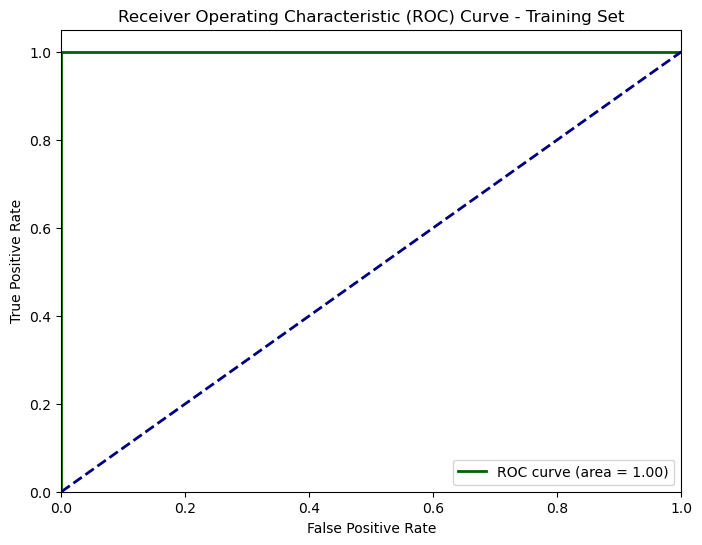

In [24]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

fpr_training, tpr_training, _ = roc_curve(y_training, y_training_prob)
roc_auc_training = auc(fpr_training, tpr_training)

plt.figure(figsize=(8, 6))
plt.plot(fpr_training, tpr_training, color='darkgreen', lw=2, label=f'ROC curve (area = {roc_auc_training:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Training Set')
plt.legend(loc='lower right')
plt.show()


### 1. (d) Research how class imbalance is addressed in random forests. Compensate for class imbalance in your random forest and repeat 1c. Compare the results with those of 1c.

**Handling class imbalance in random forests involves various strategies:**

- **Balanced Random Forest:** This approach adjusts class weights to prioritize the minority class during model training, ensuring fair representation of all classes.

- **Resampling Techniques:** Techniques such as undersampling the majority class or oversampling the minority class can rebalance the dataset, enhancing model performance on the minority class.

- **Cost-sensitive Learning:** By assigning different costs to misclassifications, random forests can be tailored to focus on minimizing errors in the minority class, thereby improving overall accuracy.

- **Ensemble Methods:** Ensemble techniques combine multiple random forest classifiers trained on different versions of the dataset, leveraging diverse perspectives to improve classification accuracy, particularly for imbalanced datasets.

- **Anomaly Detection:** Utilizing random forests for anomaly detection involves treating the minority class as anomalies and training the model to effectively identify these rare instances, thereby enhancing detection performance.


In [25]:
class_weights = {0: 1, 1: 10}  
rf_classifier_weighted = RandomForestClassifier(random_state=42, class_weight=class_weights, oob_score=True)

rf_classifier_weighted.fit(X_training, y_training)

y_training_pred_weighted = rf_classifier_weighted.predict(X_training)
y_testing_pred_weighted = rf_classifier_weighted.predict(X_testing)

confusion_matrix_training_weighted = confusion_matrix(y_training, y_training_pred_weighted)
confusion_matrix_testing_weighted = confusion_matrix(y_testing, y_testing_pred_weighted)

y_testing_prob_weighted = rf_classifier_weighted.predict_proba(X_testing)[:, 1]
fpr_weighted, tpr_weighted, thresholds_weighted = roc_curve(y_testing, y_testing_prob_weighted)
roc_auc_weighted = auc(fpr_weighted, tpr_weighted)

y_training_prob_weighted = rf_classifier_weighted.predict_proba(X_training)[:, 1]
fpr_training_weighted, tpr_training_weighted, _ = roc_curve(y_training, y_training_prob_weighted)
roc_auc_training_weighted = auc(fpr_training_weighted, tpr_training_weighted)

misclassification_training_weighted = 1 - accuracy_score(y_training, y_training_pred_weighted)
misclassification_testing_weighted = 1 - accuracy_score(y_testing, y_testing_pred_weighted)

oob_error_weighted = 1 - rf_classifier_weighted.oob_score_

print("Confusion Matrix (Training Set, Weighted):\n", confusion_matrix_training_weighted)
print("Confusion Matrix (Test Set, Weighted):\n", confusion_matrix_testing_weighted)
print("ROC AUC (Test Set, Weighted):", roc_auc_weighted)
print("Misclassification (Training Set, Weighted):", misclassification_training_weighted)
print("Misclassification (Test Set, Weighted):", misclassification_testing_weighted)
print("Out of Bag (OOB) Error Estimate (Weighted):", oob_error_weighted)


Confusion Matrix (Training Set, Weighted):
 [[59000     0]
 [    1   999]]
Confusion Matrix (Test Set, Weighted):
 [[15615    10]
 [  143   232]]
ROC AUC (Test Set, Weighted): 0.9922873173333333
Misclassification (Training Set, Weighted): 1.666666666666483e-05
Misclassification (Test Set, Weighted): 0.00956250000000003
Out of Bag (OOB) Error Estimate (Weighted): 0.007016666666666671


### Observation:

- The weighted random forest (1d) exhibits some performance differences compared to the unweighted random forest (1c) on the test set. It appears slightly more conservative in classifying the positive class, leading to a higher misclassification rate and a slightly lower ROC AUC. According to the metrics provided, the unweighted model demonstrated slightly better performance on the test data. The decision between weighted and unweighted models should be based on the specific objectives and requirements of the classification task.


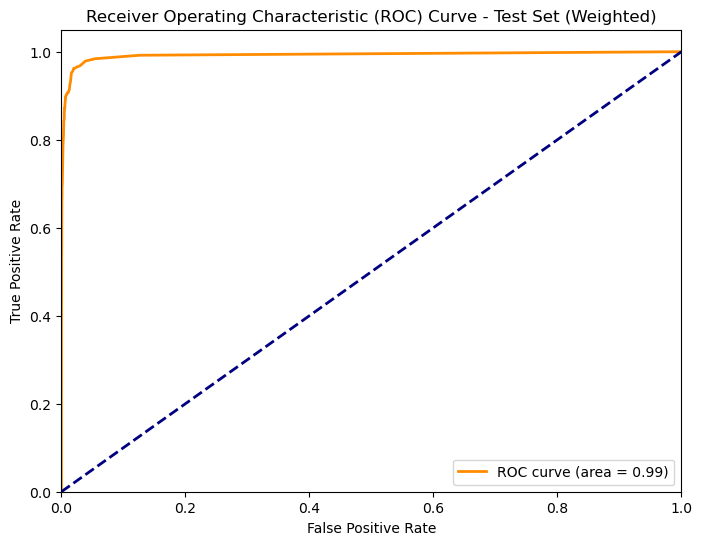

In [26]:
fpr_weighted, tpr_weighted, _ = roc_curve(y_testing, y_testing_prob_weighted)
roc_auc_weighted = auc(fpr_weighted, tpr_weighted)

plt.figure(figsize=(8, 6))
plt.plot(fpr_weighted, tpr_weighted, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc_weighted:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Test Set (Weighted)')
plt.legend(loc='lower right')
plt.show()


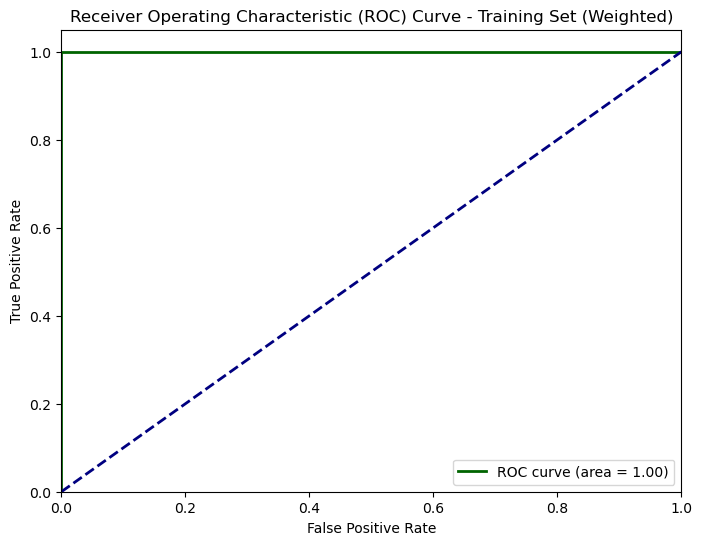

In [27]:
fpr_train_weighted, tpr_train_weighted, _ = roc_curve(y_training, y_training_prob_weighted)
roc_auc_train_weighted = auc(fpr_train_weighted, tpr_train_weighted)

plt.figure(figsize=(8, 6))
plt.plot(fpr_train_weighted, tpr_train_weighted, color='darkgreen', lw=2, label=f'ROC curve (area = {roc_auc_train_weighted:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Training Set (Weighted)')
plt.legend(loc='lower right')
plt.show()


### 1. (e) XGBoost and Model Trees
### In the case of a univariate tree, only one input dimension is used at a tree split. In a multivariate tree, or model tree, at a decision node all input dimensions can be used and thus it is more general. In univariate classification trees, majority polling is used at each node to determine the split of that node as the decision rule. In model trees, a (linear) model that relies on all of the variables is used to determine the split of that node (i.e. instead of using Xj > s as the decision rule, one has Pj βjXj > s. as the decision rule). Alternatively, in a regression tree, instead of using average in the region associated with each node, a linear regression model is used to determine the value associated with that node.
### One of the methods that can be used at each node is Logistic Regression. Because the number of variables is large in this problem, one can use L1-penalized logistic regression at each node. You can use XGBoost to fit the model tree. Determine α (the regularization term) using cross-validation. Train the model for the APS data set without compensation for class imbalance. Use one of 5 fold, 10 fold, and leave-one-out cross validation methods to estimate the error of your trained model and compare it with the test error. Report the Confusion Matrix, ROC, and AUC for training and test sets.

In [28]:
from imblearn.over_sampling import SMOTE
import xgboost as xgb
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import KFold, cross_val_score, StratifiedKFold
from sklearn.model_selection import GridSearchCV

log_regCV = LogisticRegressionCV(penalty = 'l1', solver = 'saga', cv = 5)
log_regCV.fit(X_training, y_training)


LogisticRegressionCV(cv=5, penalty='l1', solver='saga')

In [29]:
log_regCV.score(X_training, y_training)

0.98325

In [30]:
log_regCV.score(X_testing, y_testing)

0.9775

In [31]:
1/(log_regCV.C_)

array([0.0001])

In [32]:
xgb_classifier = xgb.XGBClassifier(
    base_score=0.5,
    learning_rate=0.1,
    n_estimators=100,
    objective='binary:logistic',
    reg_alpha=1.0,
    random_state=42,
)


In [33]:
param_grid = {
    'reg_alpha': [0.01, 0.1, 1.0, 10.0],  
}


In [34]:
grid_search = GridSearchCV(estimator=xgb_classifier, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_training, y_training)


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=0.5, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=100,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             param_grid={'reg_alpha': [0.01, 0.1, 1.0, 10.0]},
             scoring='accuracy')

In [35]:
best_alpha = grid_search.best_params_['reg_alpha']
print('Best alpha:', best_alpha)


Best alpha: 0.01


In [36]:
xgb_classifier = xgb.XGBClassifier(
    base_score=0.5,
    learning_rate=0.1,
    n_estimators=100,
    reg_alpha=best_alpha,
    objective='binary:logistic',
    random_state=42,
)
xgb_classifier.fit(X_training, y_training)



XGBClassifier(base_score=0.5, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [37]:
y_training_pred = xgb_classifier.predict(X_training)
y_testing_pred = xgb_classifier.predict(X_testing)

confusion_matrix_training = confusion_matrix(y_training, y_training_pred)
confusion_matrix_testing = confusion_matrix(y_testing, y_testing_pred)

y_training_prob = xgb_classifier.predict_proba(X_training)[:, 1]
fpr_training, tpr_training, thresholds_training = roc_curve(y_training, y_training_prob)
roc_auc_training = roc_auc_score(y_training, y_training_prob)

y_testing_prob = xgb_classifier.predict_proba(X_testing)[:, 1]
fpr_testing, tpr_testing, thresholds_testing = roc_curve(y_testing, y_testing_prob)
roc_auc_testing = roc_auc_score(y_testing, y_testing_prob)

print("Confusion Matrix (Training Set):\n", confusion_matrix_training)
print("Confusion Matrix (Test Set):\n", confusion_matrix_testing)
print("ROC AUC (Training Set):", roc_auc_training)
print("ROC AUC (Test Set):", roc_auc_testing)
print("Cross-Validation Scores:", cv)


Confusion Matrix (Training Set):
 [[58999     1]
 [   32   968]]
Confusion Matrix (Test Set):
 [[15609    16]
 [   90   285]]
ROC AUC (Training Set): 0.9998571779661017
ROC AUC (Test Set): 0.9943386453333333
Cross-Validation Scores: aa_000      2.450938
ab_000      2.328400
ac_000      2.169767
ad_000    183.847620
ae_000     23.190937
             ...    
ee_007      4.962483
ee_008      3.222010
ee_009      5.626979
ef_000     47.124953
eg_000     40.553250
Length: 170, dtype: float64


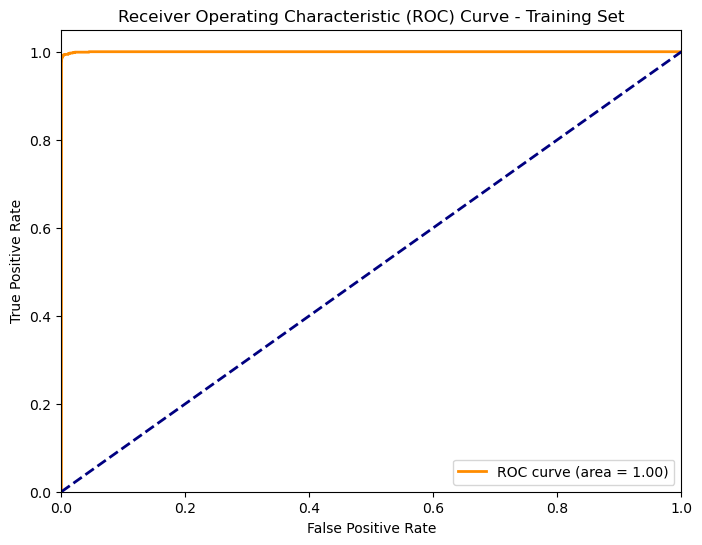

In [38]:
plt.figure(figsize=(8, 6))
plt.plot(fpr_training, tpr_training, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc_training:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Training Set')
plt.legend(loc='lower right')

plt.show()


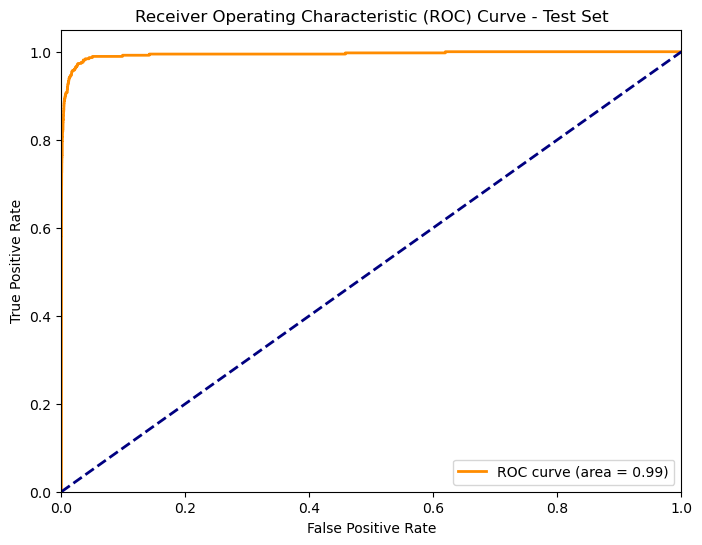

In [39]:
plt.figure(figsize=(8, 6))
plt.plot(fpr_testing, tpr_testing, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc_testing:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Test Set')
plt.legend(loc='lower right')

plt.show()


### 1. (f) Use SMOTE (Synthetic Minority Over-sampling Technique) to pre-process your data to compensate for class imbalance.4 Train XGBosst with L1-penalized lo- gistic regression at each node using the pre-processed data and repeat 1e. Do not forget that there is a right and a wrong way of cross validation here. Compare the uncompensated case with SMOTE case.

#### SMOTE should be performed inside the cross validation at every fold. This is the right way of performing cross validation

In [40]:
sm = SMOTE()
X_train_resampled, y_train_resampled = sm.fit_resample(X_training, y_training)

alpha_list = [0.1, 0.5, 1.0]

clf = XGBClassifier(objective='binary:logistic')

param_grid = {'reg_alpha': alpha_list}
grid_search = GridSearchCV(clf, param_grid, cv=5)
grid_search.fit(X_train_resampled, y_train_resampled)
bestAlpha = grid_search.best_params_['reg_alpha']

clf_final = XGBClassifier(objective='binary:logistic', reg_alpha=bestAlpha)

clf_final.fit(X_train_resampled, y_train_resampled)

y_pred_testing = clf_final.predict(X_testing)
y_pred_training = clf_final.predict(X_train_resampled)

test_accuracy = accuracy_score(y_testing, y_pred_testing)
train_accuracy = accuracy_score(y_train_resampled, y_pred_training)
test_error = 1 - test_accuracy
train_error = 1 - train_accuracy

print('Test Set accuracy:', test_accuracy)
print('Train Set accuracy:', train_accuracy)
print('Test Set error:', test_error)
print('Train Set error:', train_error)


Test Set accuracy: 0.9823125
Train Set accuracy: 0.9999915254237288
Test Set error: 0.017687499999999967
Train Set error: 8.47457627117798e-06


#### We shouldn't sample the test data set with SMOTE , because test data set should reflect class imbalance, then only we can understand the performance of our classifier.

AUC - Test Set: 0.98989568
AUC - Train Set: 0.9999999669635162


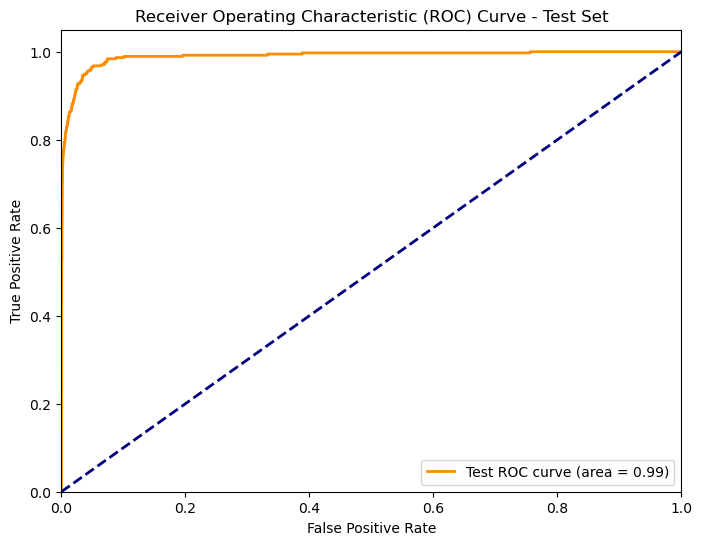

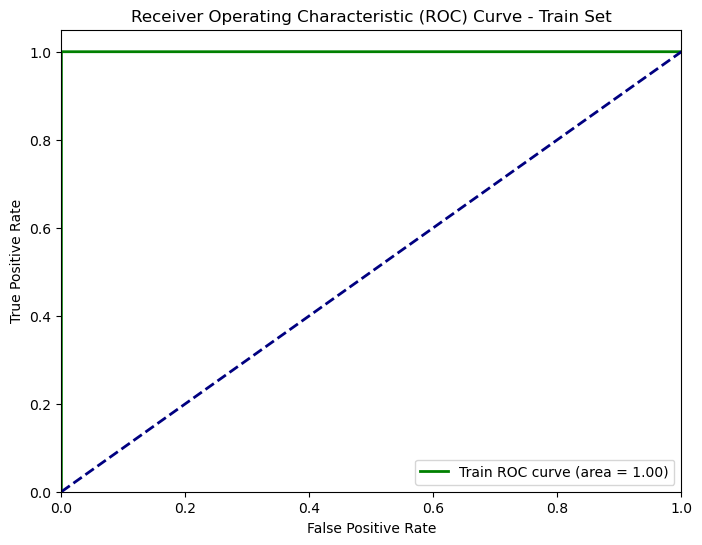

In [41]:
y_prob_testing = clf_final.predict_proba(X_testing)[:, 1]
y_prob_training = clf_final.predict_proba(X_train_resampled)[:, 1]

fpr_testing, tpr_testing, _ = roc_curve(y_testing, y_prob_testing)
roc_auc_testing = roc_auc_score(y_testing, y_prob_testing)

fpr_training, tpr_training, _ = roc_curve(y_train_resampled, y_prob_training)
roc_auc_training = roc_auc_score(y_train_resampled, y_prob_training)

plt.figure(figsize=(8, 6))
plt.plot(fpr_testing, tpr_testing, color='darkorange', lw=2, label=f'Test ROC curve (area = {roc_auc_testing:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Test Set')
plt.legend(loc='lower right')
print("AUC - Test Set:", roc_auc_testing)

plt.figure(figsize=(8, 6))
plt.plot(fpr_training, tpr_training, color='green', lw=2, label=f'Train ROC curve (area = {roc_auc_training:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Train Set')
plt.legend(loc='lower right')
print("AUC - Train Set:", roc_auc_training)

plt.show()


### Observation:
- We observe that the SMOTE variant demonstrates improved predictions on the positive class. This is evident from the higher AUC values achieved. However, it's worth noting that SMOTE introduces some noise, which leads to a reduction in overall accuracy. Despite this, the primary objective is to accurately identify the minority class label, where SMOTE exhibits superior performance.


### 2  ISLR 6.6.3

(a) **Training RSS**

**Q:** As we increase  s  from 0, the training RSS will:

i. Increase initially, and then eventually start decreasing in an inverted U shape.

ii. Decrease initially, and then eventually start increasing in a U shape.

iii. Steadily increase.

iv. Steadily decrease.

v. Remain constant.

**A:** Part iv. - steadily decrease.

Minimizing the RSS (subject to the constraint that summation of j =1 to p   (|βj|≤s) is just another formulation for how the lasso parameters are selected. Once s is sufficiently large, the least squares solution will satisfy the constraint. In this situation, the RSS=∑ni=1(yi−β0−(summation of j =1 to p(βjxij)** 2) and also satisfies this constraint will always be the least squares solution. Up until that point, the training RSS will monotonically decrease.

(b) **Test RSS**

**Q:** Repeat (a) for test RSS.

**A:** Part ii. - decrease initially, and then eventually start increasing in a U shape.

When s = 0, the only β^ that will satisfy summation of j =1 to p (|βj|≤s)
 will be a vector of zeros, so here we will simply have the null model (y^=y¯
). As s increases and this constraint loosens, the flexibility of the model will increase. The test RSS will therefore decrease, up to the point where it will begin to overfit (at which point, it will start increasing again).



(c) **Variance**

**Q:** Repeat (a) for variance.

**A:** Part iii. - steadily increase.

This is because the constraint region increasing in size (s increasing from zero) corresponds to λ decreasing (a reduction in shrinkage), so model flexibility is increasing and so an increase in variance will occur. If s is sufficiently large so that β^ falls within the constraint region, the variance will no longer increase, because the β^ chosen will always be the least squares estimate.



(d) **Squared Bias**

**Q:** Repeat (a) for (squared) bias.

**A:** Part iv. - steadily decrease.

Same reasoning as part (c) - increasing the flexibility will decrease the bias. Again, this will stop reducing if the least squares solution falls within the constraint region.

(e) **Irreducible Error**

**Q:** Repeat (a) for the irreducible error.

**A:** Part v. - remain constant.

The irreducible error is the error introduced by inherent uncertainty/noise in the system being approximated. It remains constant regardless of model flexibility, because there may be unmeasured variables not in  X  that would be required to explain it, or unmeasurable variation in  y that cannot be predicted with the variables in  X , regardless of how well-specified the model is (so basically, it is completely independent of  s .


# ISLR 6.6.5

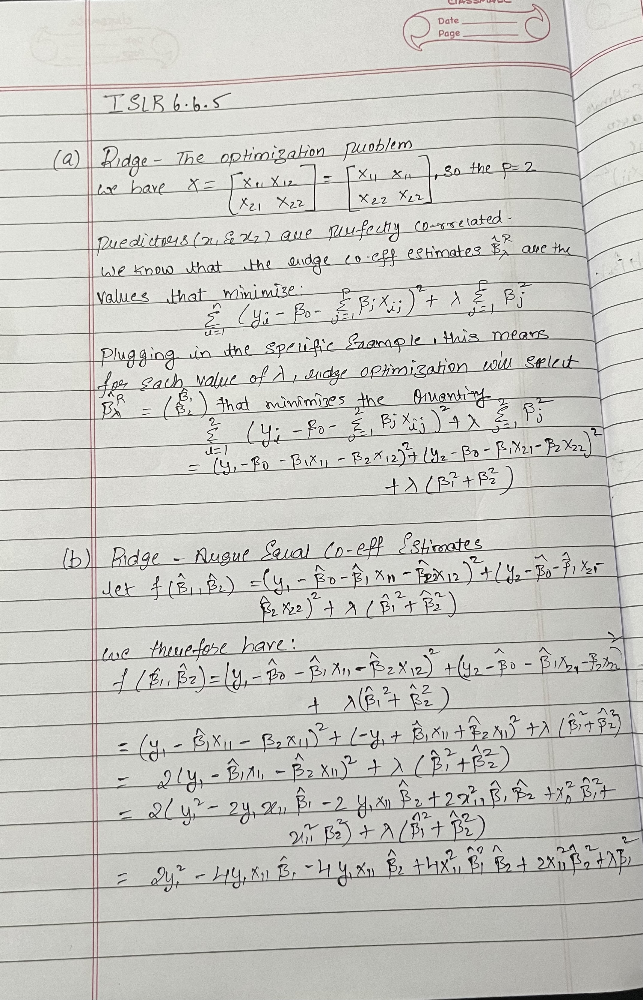

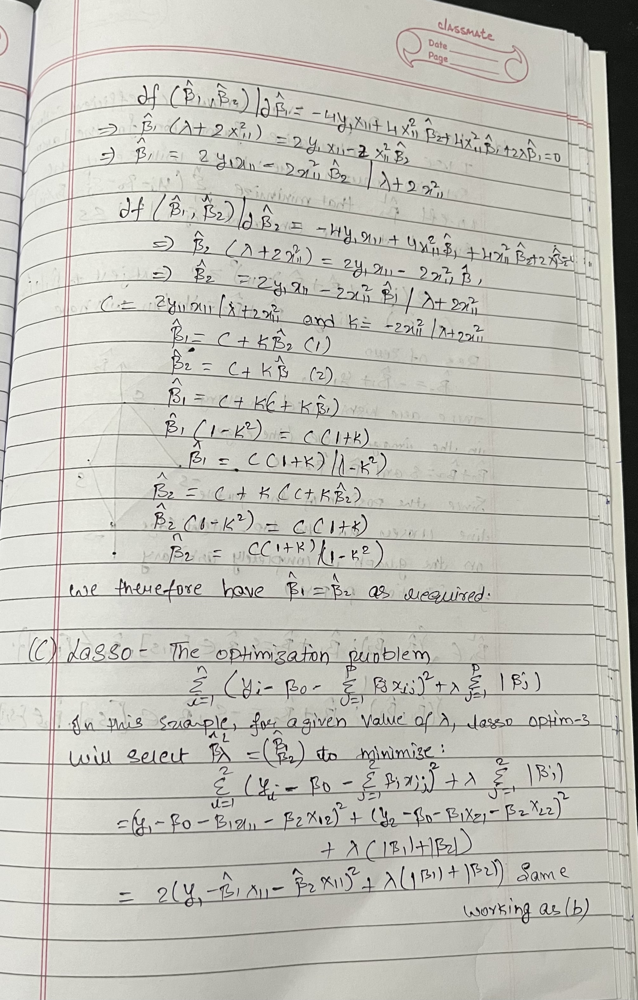

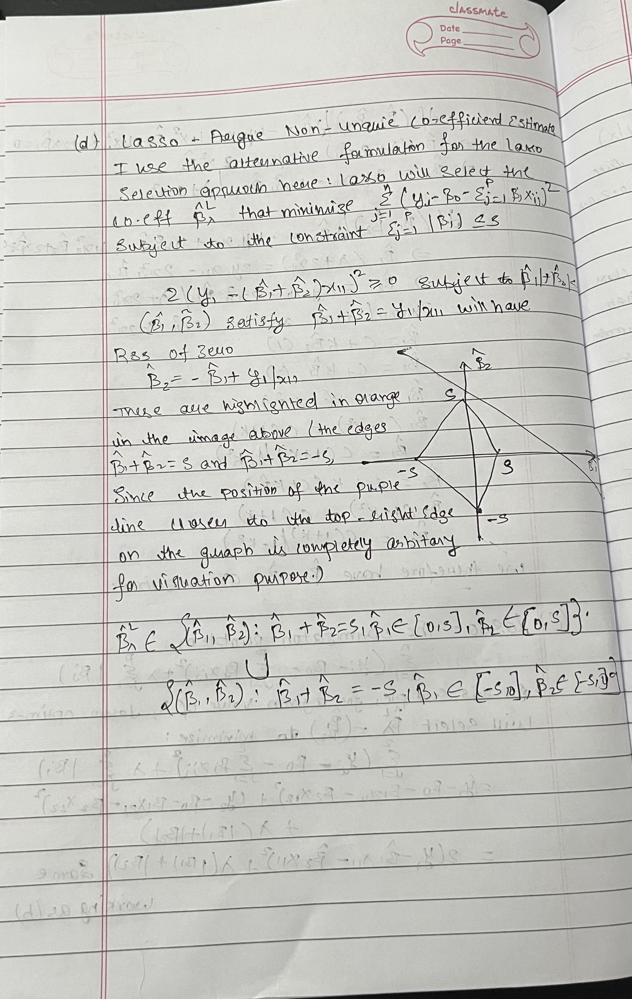

# 4. ISLR 8.4.5

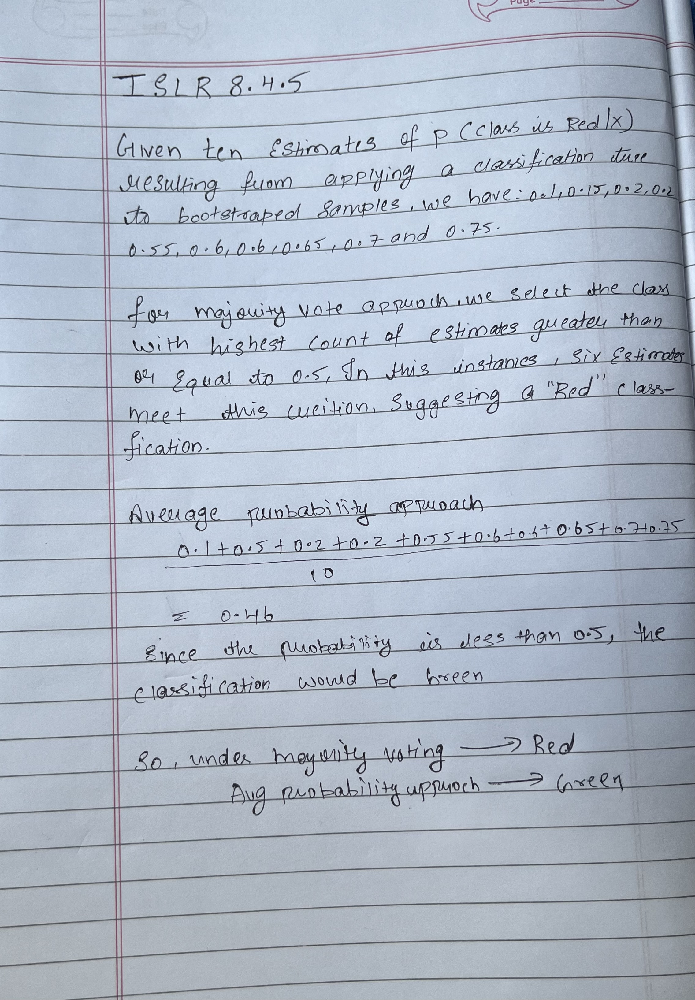

# 5. ISLR 9.7.3

#### (a) Sketched below.

#### (b) In the plotted graph, the optimal separating hyperplane must be positioned between the observations (2,1) and (2,2), as well as between the observations (4,3) and (4,4). It forms a straight line passing through the coordinates (2,1.5) and (4,3.5). The equation representing this hyperplane is -0.5 + X1 - X2 = 0.

#### (c) The equation of the optimal separating hyperplane, as derived from the given information, can be expressed as X2 = X1 - 0.5. Visually, we can infer that the maximal margin classifier will predict a data point as "Red" when X2 is greater than X1 - 0.5, which can be represented as X2 - X1 + 0.5 > 0. For cases where this condition is not met, it will classify the data point as "Blue." In terms of coefficients, the values (β0, β1, β2) are (0.5, -1, 1).

#### (d) The maximal margin hyperplane is represented by the solid green line, while the margin is the measure of the distance from this solid line to either of the dashed lines. In this case, the green dashed lines serve as an indicator of the maximal margin. The width of the margin, in this scenario, is precisely 1/4.

#### (e) The support vectors correspond to the observations located at coordinates (2,1), (2,2), (4,3), and (4,4). These circled points, identified as support vectors, are situated precisely on the margins, represented by the green dashed lines.

#### (f) Upon close observation of the plot, it becomes evident that relocating the point (4,1) would have no impact on the position of the maximal margin hyperplane. This is because (4,1) is not a support vector. Only points that are in close proximity to the decision boundary significantly influence the maximal margin hyperplane's position, whereas others do not.

#### (g) As an illustration, the hyperplane represented by the blue line with the equation X1−X2−0.3=0 does not serve as the optimal separating hyperplane.

#### (h) Upon the introduction of a new point, denoted by the red triangle at coordinates (4,2), to the plot, it becomes evident that the two classes can no longer be separated by a hyperplane. This results in a situation where they are no longer linearly separable.

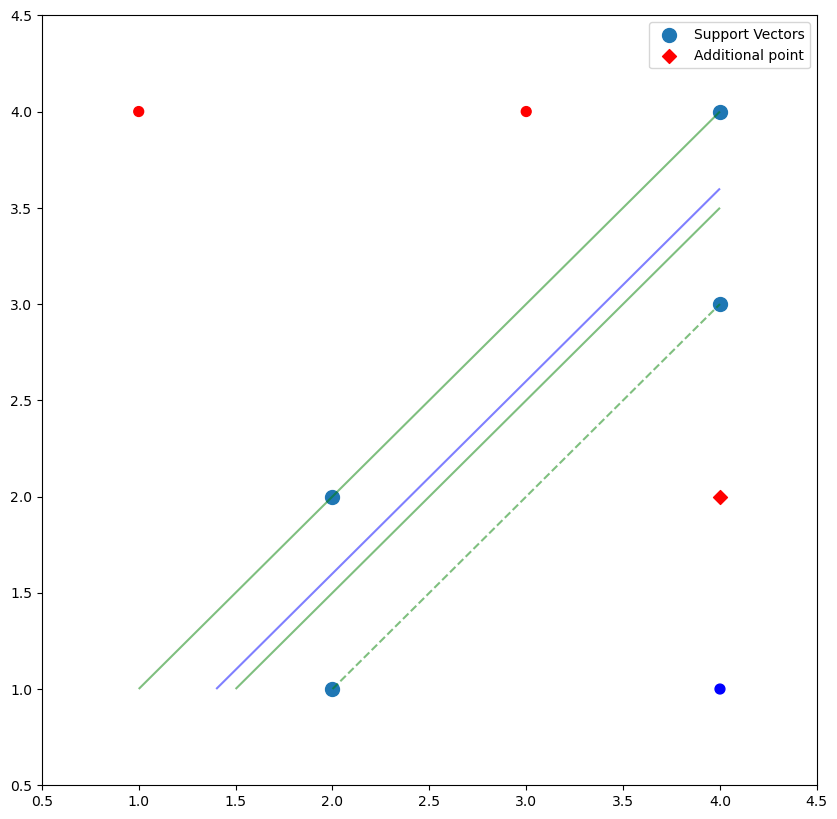

[0.99970703] [[-1.99941406  1.99941406]]


In [42]:
coords = {'x1': [3, 2, 4, 1, 2, 4, 4],
          'x2': [4, 2, 4, 4, 1, 3, 1],
          'y': ['r', 'r', 'r', 'r', 'b', 'b', 'b']}

df = pd.DataFrame.from_dict(coords)

clf = SVC(kernel='linear', C=15000)
clf.fit(df.iloc[:, :-1], df.iloc[:, -1])

xx, yy = np.meshgrid(np.linspace(df['x1'].min(), df['x1'].max(), 30),
                     np.linspace(df['x2'].min(), df['x2'].max(), 30))
xy = np.column_stack((xx.ravel(), yy.ravel()))

fig, ax = plt.subplots(figsize=(10, 10))

ax.scatter(df['x1'], df['x2'], c=df['y'], s=50, cmap=plt.cm.Paired)

ax.contour(xx, yy, clf.decision_function(xy).reshape(xx.shape), colors='green', levels=[-1, 0, 1], alpha=0.5, label="Decision Boundary")

ax.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=100, label="Support Vectors")

ax.contour(xx, yy, clf.decision_function(xy).reshape(xx.shape) - 0.2, colors='blue', levels=[0], alpha=0.5)

ax.scatter([4.0], [2.0], color='red', marker='D', s=50, label="Additional point")

ax.legend()

plt.xlim([0.5, 4.5])
plt.ylim([0.5, 4.5])

plt.show()

print(clf.intercept_, clf.coef_)


In [43]:
# pip freeze > requirements.text